In [2]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import re

In [4]:
import time

time.strftime("%Y")

'2021'

In [76]:
df1=pd.read_csv('data/cleaned_data_with2.csv')

In [77]:
df1.head(23)

,Unnamed: 0,Price,city,History,Millage,Ratings,Year,Make,Model,Transmission,Age
0,0,4965000,Abia,foreign,149232,4.7,2015,Honda,Accord,Automatic,5
1,1,1280000,Accra,local,145078,4.4,2005,Toyota,Corolla,Automatic,15
2,2,1280000,Accra,local,91691,4.6,2008,Toyota,Corolla,Automatic,12
3,3,1567500,Lagos,local,234797,4.5,2004,Toyota,Corolla,Automatic,16
4,4,6065000,Lagos,foreign,145678,4.8,2013,Hyundai,Azera,Automatic,7
5,5,2890000,Abia,foreign,207237,4.7,2009,Toyota,Sienna,Automatic,11
6,6,6615000,Lagos,foreign,76201,4.5,2009,Toyota,Venza,Automatic,11
7,7,4195000,Lagos,foreign,124275,4.9,2015,Nissan,Versa,Automatic,5
8,8,2085000,Accra,local,0,4.0,2010,Toyota,Avensis,Automatic,10
9,9,8375000,Lagos,local,195089,4.5,2006,Toyota,Camry,Automatic,14


In [78]:
df1.drop(['Unnamed: 0','Year'],axis=1,inplace=True)

In [79]:
## we have to Convert the Price and Millage to intergers
df1['Millage']=pd.to_numeric(df1['Millage'], errors='coerce')
df1['Price']=pd.to_numeric(df1['Price'], errors='coerce')

In [80]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17228 entries, 0 to 17227
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Price         13967 non-null  float64
 1   city          17228 non-null  object 
 2   History       17228 non-null  object 
 3   Millage       14078 non-null  float64
 4   Ratings       17228 non-null  float64
 5   Make          17228 non-null  object 
 6   Model         17228 non-null  object 
 7   Transmission  17228 non-null  object 
 8   Age           17228 non-null  int64  
dtypes: float64(3), int64(1), object(5)
memory usage: 1.2+ MB


In [81]:
df1.dropna(inplace=True)

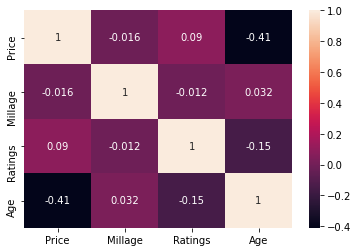

In [82]:
sns.heatmap(df1.corr(),annot=True)

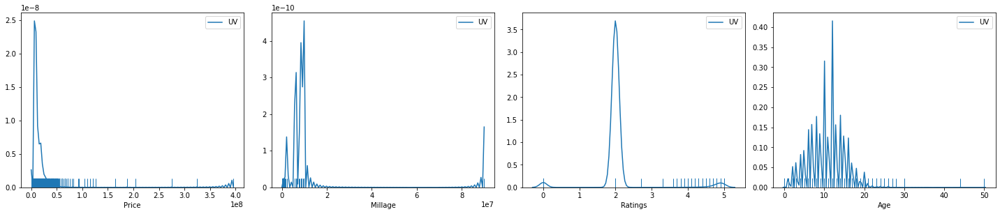

In [83]:
num_cols = df1.select_dtypes(exclude=['object'])
fig = plt.figure(figsize=(20,8))

for col in range(len(num_cols.columns)):
    fig.add_subplot(2,4,col+1)
    sns.distplot(num_cols.iloc[:,col], hist=False, rug=True, kde_kws={'bw':0.1}, label='UV')
    plt.xlabel(num_cols.columns[col])

plt.tight_layout()

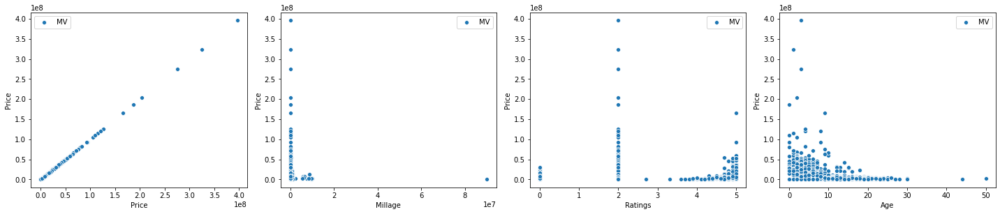

In [84]:
fig = plt.figure(figsize=(20,8))

for col in range(len(num_cols.columns)):
    fig.add_subplot(2,4,col+1)
    sns.scatterplot(x=num_cols.iloc[:,col], y=df1['Price'], label='MV')
    plt.xlabel(num_cols.columns[col])

plt.tight_layout()


In [85]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13967 entries, 0 to 13966
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Price         13967 non-null  float64
 1   city          13967 non-null  object 
 2   History       13967 non-null  object 
 3   Millage       13967 non-null  float64
 4   Ratings       13967 non-null  float64
 5   Make          13967 non-null  object 
 6   Model         13967 non-null  object 
 7   Transmission  13967 non-null  object 
 8   Age           13967 non-null  int64  
dtypes: float64(3), int64(1), object(5)
memory usage: 1.1+ MB


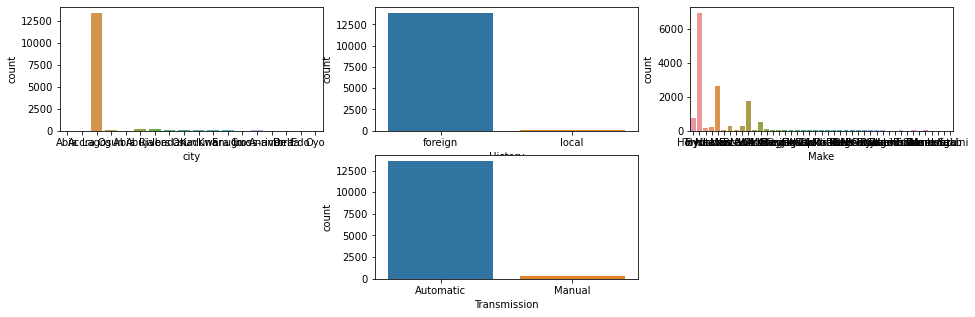

In [86]:
fig = plt.figure(figsize=(16,5))
fig.add_subplot(2,3,1)
sns.countplot(df1['city'])
fig.add_subplot(2,3,2)
sns.countplot(df1['History'])
fig.add_subplot(2,3,3)
sns.countplot(df1['Make'])

fig.add_subplot(2,3,5)
sns.countplot(df1['Transmission'])

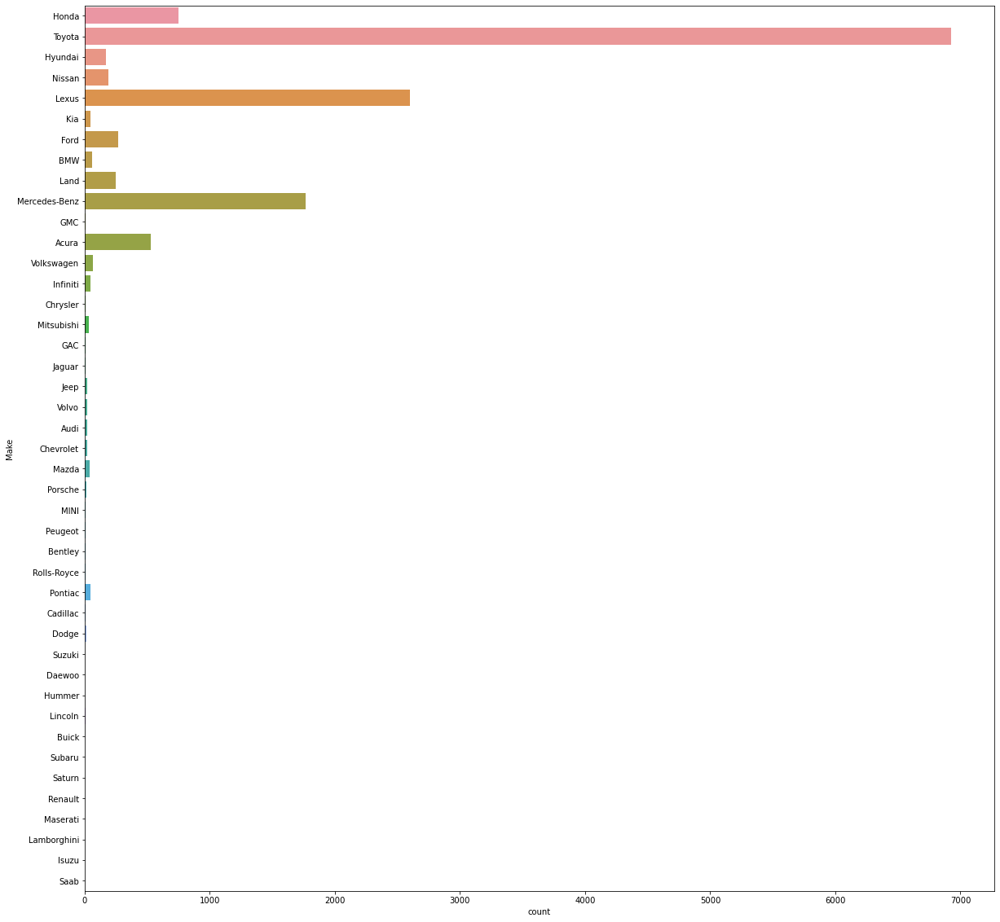

In [87]:
plt.figure(figsize=(20,20))
sns.countplot(y=df1.Make)

In [88]:
df1_new = pd.get_dummies(df1)

In [89]:
df1_new

,Price,Millage,Ratings,Age,city_Abia,city_Abia,city_Abuja,city_Accra,city_Anambra,city_Cross-river,...,Model_XK,Model_XL-7,Model_XTS,Model_Xterra,Model_Yaris,Model_Z4,Model_ZDX,Model_ix35,Transmission_Automatic,Transmission_Manual
0,4965000.0,149232.0,4.7,5,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,1280000.0,145078.0,4.4,15,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
2,1280000.0,91691.0,4.6,12,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
3,1567500.0,234797.0,4.5,16,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,6065000.0,145678.0,4.8,7,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13962,2890000.0,0.0,0.0,15,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
13963,0.0,123442.0,0.0,15,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
13964,2315000.0,0.0,0.0,18,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
13965,1970000.0,0.0,0.0,17,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [90]:
X = df1_new.drop(['Price'], axis=1)
y = df1_new['Price']

In [91]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from math import sqrt
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.svm import SVC
from sklearn.linear_model import Ridge,ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.metrics import accuracy_score
from sklearn.linear_model import Lasso

In [92]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

In [93]:
log_clf=LinearRegression()
bye_clf=BayesianRidge()
rnd_clf = RandomForestRegressor()
rid_clf = Ridge(alpha=2,max_iter=1000,random_state=1)
ele_clf = ElasticNet()
gbr_clf=GradientBoostingRegressor()
lss_clf=Lasso()

In [94]:
voting_clf = VotingRegressor([('lr', log_clf),('bye', bye_clf), ('rf', rnd_clf), ('rnd', rnd_clf), ('ele', ele_clf), ('gbr', gbr_clf), ('lss', lss_clf)])
voting_clf.fit(X_train, y_train)

VotingRegressor(estimators=[('lr', LinearRegression()),
                            ('bye', BayesianRidge()),
                            ('rf', RandomForestRegressor()),
                            ('rnd', RandomForestRegressor()),
                            ('ele', ElasticNet()),
                            ('gbr', GradientBoostingRegressor()),
                            ('lss', Lasso())])

In [95]:
for clf in (log_clf, rnd_clf, rid_clf, bye_clf, voting_clf,ele_clf, gbr_clf,lss_clf):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(clf.__class__.__name__, 'r2_score', r2_score(y_test, y_pred))

LinearRegression r2_score -4491105.84293293
RandomForestRegressor r2_score 0.4177230266644987
Ridge r2_score 0.2656763555637712
BayesianRidge r2_score 0.00021005988382516438
VotingRegressor r2_score -91666.46751476543
ElasticNet r2_score 0.21925394400718856
GradientBoostingRegressor r2_score 0.3752180069833122
Lasso r2_score 0.24318196197106268


In [96]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

In [97]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.20, random_state=7)

In [98]:
voting_clf2 = VotingRegressor([('lr', log_clf),('bye', bye_clf), ('rf', rnd_clf), ('rnd', rnd_clf), ('ele', ele_clf), ('gbr', gbr_clf),('lss', lss_clf)])
voting_clf.fit(X_train, y_train)

VotingRegressor(estimators=[('lr', LinearRegression()),
                            ('bye', BayesianRidge()),
                            ('rf', RandomForestRegressor()),
                            ('rnd', RandomForestRegressor()),
                            ('ele', ElasticNet()),
                            ('gbr', GradientBoostingRegressor()),
                            ('lss', Lasso())])

In [99]:
for clf in (log_clf, rnd_clf, rid_clf, bye_clf,voting_clf2,ele_clf, gbr_clf,lss_clf):
    clf.fit(X_train, y_train)
    y_pred2 = clf.predict(X_test)
    print(clf.__class__.__name__, 'r2_score', r2_score(y_test, y_pred2))

LinearRegression r2_score -1.0405635431390256e+21
RandomForestRegressor r2_score 0.3559724343694528
Ridge r2_score 0.22903095252866834
BayesianRidge r2_score -0.00013442181739709014
VotingRegressor r2_score -2.1235990676210258e+19
ElasticNet r2_score 0.019340499998744765
GradientBoostingRegressor r2_score 0.3200273878256036
Lasso r2_score 0.22355134068854732
